In [8]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
import numpy as np
from sklearn.decomposition import IncrementalPCA
from random import sample
from numpy.random import uniform
from sklearn.neighbors import NearestNeighbors
from math import isnan
from sklearn.preprocessing import scale
import geopandas as gpd
import contextily as ctx 


In [9]:
local_crs = 27700
place = "test"
lat = 55.86421405612109
lng = -4.251846930489373
country = "UK"
crs=4326
radius=1

In [10]:
grid = gpd.read_parquet(f"output/{place}/p5-grid-output.pq")

In [11]:
grid.set_index(['row', 'col'], inplace=True)

In [12]:
geo_col = grid[['geometry']]

In [13]:
geo_col

geometry
row col                                                   
5   26   POLYGON ((259886.298 666251.165, 259953.670 66...
12  26   POLYGON ((259859.128 665412.420, 259926.513 66...
    25   POLYGON ((259791.742 665414.604, 259859.128 66...
14  25   POLYGON ((259783.976 665174.962, 259851.365 66...
13  26   POLYGON ((259855.246 665292.599, 259922.634 66...
...                                                    ...
3   10   POLYGON ((258816.162 666525.866, 258883.530 66...
    11   POLYGON ((258883.530 666523.667, 258950.899 66...
2   11   POLYGON ((258887.440 666643.487, 258954.807 66...
    12   POLYGON ((258954.807 666641.289, 259022.174 66...
    21   POLYGON ((259561.108 666621.554, 259628.475 66...

[340 rows x 1 columns]

In [14]:
colsubset = grid.head().columns.tolist()

In [15]:
grid.describe()

,tess_area_median,tess_area_q25,tess_area_q75,tessellation_neighbours_median,tessellation_neighbours_q25,tessellation_neighbours_q75,tess_convexity_median,tess_convexity_q25,tess_convexity_q75,tess_covered_area_median,...,edges_global_angular_closeness_quantile_0.75,edges_global_angular_betweeness_median,edges_global_angular_betweeness_quantile_0.25,edges_global_angular_betweeness_quantile_0.5,edges_global_angular_betweeness_quantile_0.75,strokes_count,strokes_stroke_length_median,strokes_stroke_length_quantile_0.25,strokes_stroke_length_quantile_0.5,strokes_stroke_length_quantile_0.75
count,338.000000,338.000000,338.000000,338.000000,338.000000,338.000000,338.000000,338.000000,338.000000,338.000000,...,340.000000,340.000000,340.000000,340.000000,340.000000,340.000000,340.000000,340.000000,340.000000,340.000000
mean,7197.852338,4648.442543,12277.815275,0.140896,0.116643,0.171036,0.932001,0.874195,0.966915,65335.355703,...,0.030339,0.000594,0.000099,0.000594,0.002901,161.552941,400.609225,182.733562,400.609225,1061.763145
std,4916.917174,2883.082860,8543.611742,0.040030,0.036836,0.049910,0.044468,0.076232,0.029572,43939.023611,...,0.002547,0.000907,0.000101,0.000907,0.003138,5.820330,282.876168,171.555879,282.876168,563.347032
min,1965.542164,877.316883,3261.434016,0.037887,0.028855,0.037887,0.550968,0.522839,0.579097,19874.981870,...,0.022001,0.000048,0.000000,0.000048,0.000365,86.000000,83.670349,30.749121,83.670349,149.502628
25%,4286.048289,2878.360401,6690.873089,0.113058,0.090533,0.139615,0.918242,0.857478,0.954314,34705.022659,...,0.028377,0.000348,0.000008,0.000348,0.001309,162.000000,194.053761,82.537765,194.053761,708.949108
50%,6637.722595,3785.716521,9199.092424,0.146046,0.116299,0.167102,0.940988,0.887863,0.969512,46047.926638,...,0.031056,0.000499,0.000079,0.000499,0.002211,162.000000,278.503966,134.553433,278.503966,892.681781
75%,8097.125967,6140.422745,15455.546729,0.164293,0.142713,0.204823,0.954905,0.927275,0.981804,74592.170423,...,0.032356,0.000669,0.000151,0.000669,0.003647,162.000000,495.347277,181.881982,495.347277,1285.791311
max,48487.119144,19136.684129,48487.119144,0.222953,0.214431,0.327969,0.997236,0.983157,0.999961,248756.070005,...,0.038219,0.015610,0.000676,0.015610,0.031556,162.000000,1776.138819,953.599658,1776.138819,4926.786416


In [16]:
grid_dropped = grid

In [17]:
grid_dropped[grid_dropped['geometry'].isnull()]

,,tess_area_median,tess_area_q25,tess_area_q75,tessellation_neighbours_median,tessellation_neighbours_q25,tessellation_neighbours_q75,tess_convexity_median,tess_convexity_q25,tess_convexity_q75,tess_covered_area_median,...,edges_global_angular_betweeness_median,edges_global_angular_betweeness_quantile_0.25,edges_global_angular_betweeness_quantile_0.5,edges_global_angular_betweeness_quantile_0.75,strokes_count,strokes_stroke_length_median,strokes_stroke_length_quantile_0.25,strokes_stroke_length_quantile_0.5,strokes_stroke_length_quantile_0.75,geometry
row,col,,,,,,,,,,,,,,,,,,,,,


In [18]:
grid_dropped.explore()

In [19]:
grid_dropped.columns.tolist()

['tess_area_median',
 'tess_area_q25',
 'tess_area_q75',
 'tessellation_neighbours_median',
 'tessellation_neighbours_q25',
 'tessellation_neighbours_q75',
 'tess_convexity_median',
 'tess_convexity_q25',
 'tess_convexity_q75',
 'tess_covered_area_median',
 'tess_covered_area_q25',
 'tess_covered_area_q75',
 'tess_orientation_median',
 'tess_orientation_q25',
 'tess_orientation_q75',
 'tess_convexity_weight_median',
 'tess_convexity_weight_q25',
 'tess_convexity_weight_q75',
 'tess_covered_area_weight_median',
 'tess_covered_area_weight_q25',
 'tess_covered_area_weight_q75',
 'tess_orientation_weight_median',
 'tess_orientation_weight_q25',
 'tess_orientation_weight_q75',
 'tess_rea_theil_median',
 'tess_rea_theil_q25',
 'tess_rea_theil_q75',
 'buildings_neighbours_200_median',
 'buildings_neighbours_200_q25',
 'buildings_neighbours_200_q75',
 'building_area_median',
 'building_area_q25',
 'building_area_q75',
 'building_circular_compactness_median',
 'building_circular_compactness_q25

In [20]:
grid_dropped = grid.dropna(subset=["entry_count"], how='all')
grid_dropped = grid_dropped[grid_dropped['entry_count'] > 2]

In [21]:
grid_dropped

tess_area_median  tess_area_q25  tess_area_q75  \
row col                                                   
5   26        6434.246025    3120.234267    8222.970961   
12  26        2593.431666    1810.351235    6039.435581   
    25        6079.116008    2289.680717    9559.958226   
14  25        5468.394987    4505.871866    6586.063746   
13  26        4707.878973    1759.473029    6158.476863   
...                   ...            ...            ...   
3   21        3994.611529    3700.218551    5868.424884   
2   19        8030.171285    2162.319537   11301.089913   
    13        4210.319060    4210.319060    6167.087854   
3   10        8892.111843    4741.603410   15001.351854   
    11        8892.111843    7896.037969   15832.643117   

         tessellation_neighbours_median  tessellation_neighbours_q25  \
row col                                                                
5   26                         0.082137                     0.064904   
12  26                         0.148232                     0.131110   
    25                         0.139619                     0.125440   
14  25                         0.125613                     0.109424   
13  26                         0.135059                     0.118665   
...                                 ...                          ...   
3   21                         0.086331                     0.086294   
2   19                         0.058753                     0.057625   
    13                         0.107778                     0.099950   
3   10                         0.079866                     0.042826   
    11                         0.053931                     0.040453   

         tessellation_neighbours_q75  tess_convexity_median  \
row col                                                       
5   26                      0.115035               0.943027   
12  26                      0.188530               0.947574   
    25                      0.181992               0.925777   
14  25                      0.144179               0.947574   
13  26                      0.179201               0.940828   
...                              ...                    ...   
3   21                      0.086331               0.863025   
2   19                      0.093109               0.938891   
    13                      0.107778               0.950217   
3   10                      0.093773               0.877968   
    11                      0.079866               0.870604   

         tess_convexity_q25  tess_convexity_q75  tess_covered_area_median  \
row col                                                                     
5   26             0.928725            0.971086              40644.163606   
12  26             0.897909            0.967978              29371.556517   
    25             0.888982            0.971530              34929.383260   
14  25             0.861820            0.972709              34694.560749   
13  26             0.879135            0.972147              31965.095505   
...                     ...                 ...                       ...   
3   21             0.853346            0.892134              22035.755022   
2   19             0.873282            0.939731              43190.966603   
    13             0.929929            0.950217              30914.190013   
3   10             0.607226            0.974280              58213.042470   
    11             0.587859            0.979359              58213.042470   

         ...  edges_global_angular_betweeness_median  \
row col  ...                                           
5   26   ...                                0.000327   
12  26   ...                                0.000590   
    25   ...                                0.000669   
14  25   ...                                0.000782   
13  26   ...                                0.000669   
...      ...                                     ...   
3   21   ...                      

In [22]:
grid_dropped.isnull().sum(axis=1).value_counts(ascending=False)

0    336
Name: count, dtype: int64

In [23]:
grid_dropped_geo = grid_dropped
grid_dropped = grid_dropped.drop(columns=["geometry"])

/home/virgilxw/miniforge3/envs/processor/lib/python3.12/site-packages/seaborn/utils.py:80: UserWarning: Glyph 9 (	) missing from current font.
  fig.canvas.draw()
/home/virgilxw/miniforge3/envs/processor/lib/python3.12/site-packages/seaborn/matrix.py:260: FutureWarning: Format strings passed to MaskedConstant are ignored, but in future may error or produce different behavior
  annotation = ("{:" + self.fmt + "}").format(val)
/tmp/ipykernel_20855/2699268375.py:3: UserWarning: Glyph 9 (	) missing from current font.
  plt.savefig('Correlation')
/home/virgilxw/miniforge3/envs/processor/lib/python3.12/site-packages/IPython/core/pylabtools.py:152: UserWarning: Glyph 9 (	) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


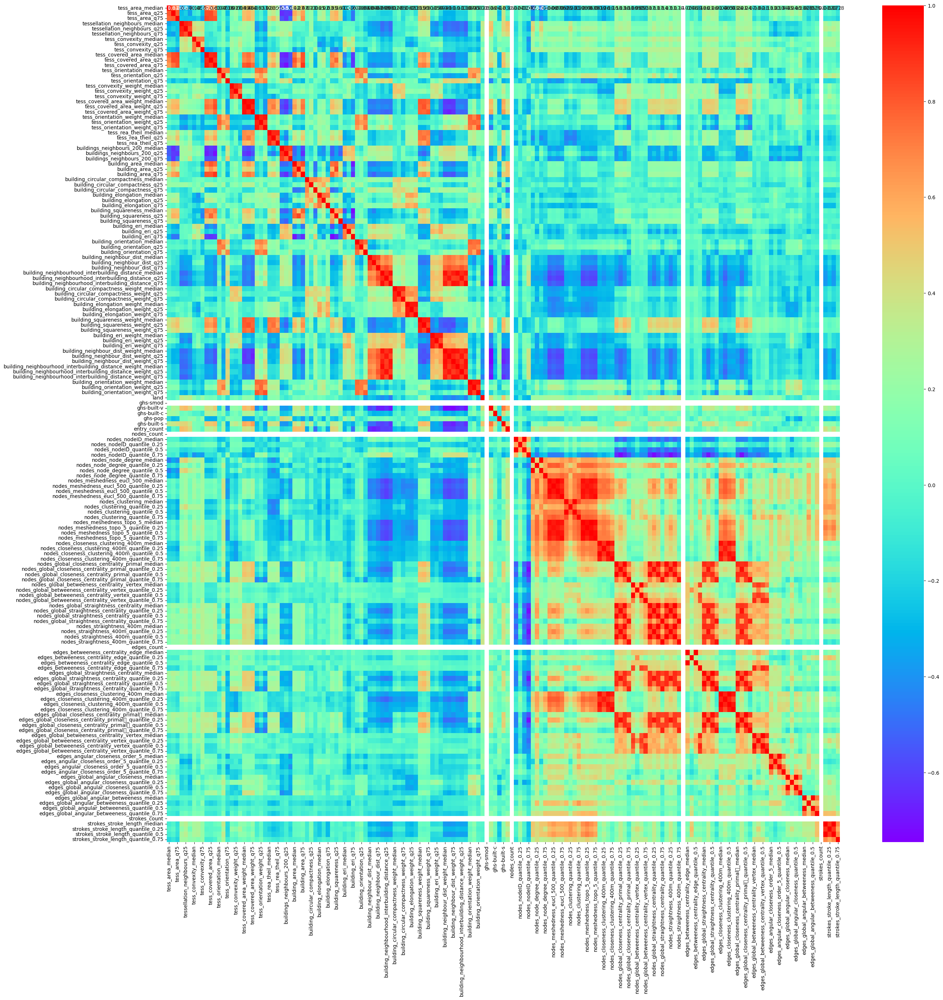

In [24]:
plt.figure(figsize = (30, 30))
sns.heatmap(grid_dropped.corr(), annot = True, cmap="rainbow")
plt.savefig('Correlation')
plt.show()

In [25]:
str(grid_dropped.index[0])

'(5, 26)'

In [26]:
scaler = StandardScaler()
tessellation_scaled = scaler.fit_transform(grid_dropped)

In [27]:
pca = PCA(svd_solver='randomized', random_state=50)


In [28]:
pca.fit(tessellation_scaled)

PCA(random_state=50, svd_solver='randomized')

In [29]:
features = grid_dropped.columns

In [30]:
pca.components_

array([[-2.60297230e-02, -4.39384701e-02, -3.13209483e-02, ...,
        -6.74558260e-02, -7.42059938e-02, -5.43257175e-02],
       [ 1.18889108e-01,  1.32811198e-01,  1.53075086e-01, ...,
        -7.49804562e-02, -8.18883303e-02, -6.08807521e-02],
       [-3.79977157e-02, -4.95775480e-02, -5.99736888e-02, ...,
        -2.28183970e-03, -3.91163744e-02,  1.68499985e-02],
       ...,
       [ 0.00000000e+00,  5.72581865e-17,  8.57056942e-17, ...,
        -2.14077572e-17, -1.38299976e-02, -4.73529395e-17],
       [-0.00000000e+00, -5.22050128e-17, -2.19966381e-17, ...,
         5.60181805e-17, -4.83185759e-02,  5.45212850e-17],
       [-0.00000000e+00, -3.54693912e-18, -1.26365950e-17, ...,
         1.43020167e-17,  1.19334783e-16,  4.22746721e-18]])

In [31]:
# Variance Ratio

pca.explained_variance_ratio_

array([2.47289383e-01, 1.31368827e-01, 1.01063630e-01, 7.59871787e-02,
       5.37142822e-02, 4.64847464e-02, 4.09851008e-02, 3.42879258e-02,
       2.41917378e-02, 1.98428022e-02, 1.78212417e-02, 1.47490221e-02,
       1.32250245e-02, 1.23429877e-02, 1.10761109e-02, 9.52234437e-03,
       8.46865827e-03, 7.61383759e-03, 7.27054144e-03, 6.62568290e-03,
       6.22261362e-03, 5.89971995e-03, 5.57072392e-03, 5.04234060e-03,
       4.83672141e-03, 4.38771964e-03, 4.16773452e-03, 3.93145964e-03,
       3.79687330e-03, 3.58699753e-03, 3.34807605e-03, 3.11018735e-03,
       2.93017506e-03, 2.82717081e-03, 2.52592557e-03, 2.29608589e-03,
       2.27033509e-03, 2.15275933e-03, 2.12121165e-03, 1.98404850e-03,
       1.84086329e-03, 1.74787999e-03, 1.66205156e-03, 1.63594173e-03,
       1.57997578e-03, 1.55595679e-03, 1.39495828e-03, 1.34062424e-03,
       1.30644060e-03, 1.25851606e-03, 1.20533692e-03, 1.18186790e-03,
       1.13690623e-03, 1.05284333e-03, 1.03601825e-03, 9.55943750e-04,
      

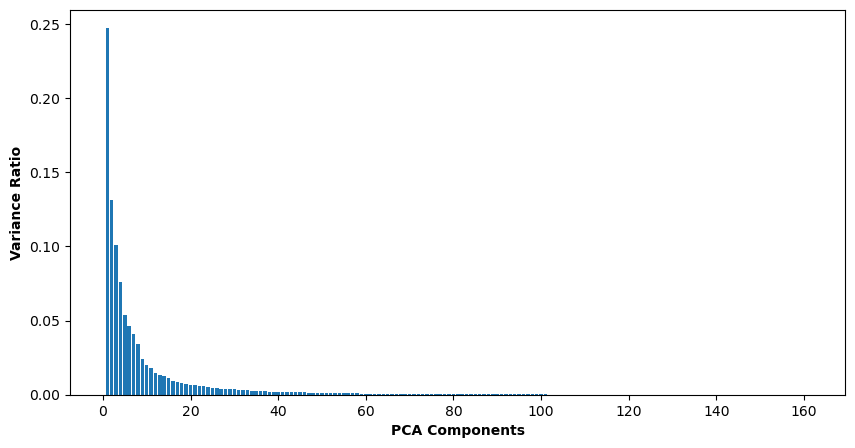

In [32]:
# Variance Ratio bar plot for each PCA components.
plt.figure(figsize = (10, 5))
ax = plt.bar(range(1,len(pca.explained_variance_ratio_)+1), pca.explained_variance_ratio_)
plt.xlabel("PCA Components",fontweight = 'bold')
plt.ylabel("Variance Ratio",fontweight = 'bold')

plt.show()

In [33]:
# calculate the cumulative sum of explained variance ratios
cumulative_sum = np.cumsum(pca.explained_variance_ratio_)

org_col = list(grid_dropped.columns)

num_pc = np.argmax(cumulative_sum >= 0.95) + 1

pc_dict = {'Attribute': org_col}

pc_dict.update({f'PC_{i+1}':pca.components_[i] for i in range(num_pc)})

attributes_pca = pd.DataFrame(pc_dict)

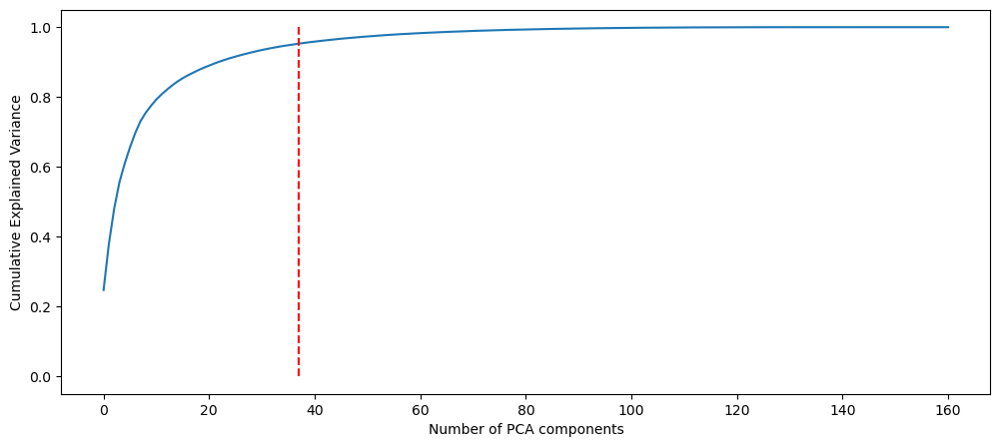

In [34]:
# Scree plot to visualize the Cumulative variance against the Number of components

fig = plt.figure(figsize = (12,5))
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.vlines(x=num_pc, ymax=1, ymin=0, colors="r", linestyles="--")
plt.xlabel('Number of PCA components')
plt.ylabel('Cumulative Explained Variance')
plt.show()

In [35]:
attributes_pca

,Attribute,PC_1,PC_2,PC_3,PC_4,PC_5,PC_6,PC_7,PC_8,PC_9,...,PC_28,PC_29,PC_30,PC_31,PC_32,PC_33,PC_34,PC_35,PC_36,PC_37
0,tess_area_median,-0.026030,0.118889,-0.037998,0.042354,-0.123752,0.077922,-0.067121,-0.054813,0.062812,...,0.081700,0.064143,0.073470,0.156017,0.020263,0.037675,-0.063521,0.027965,-0.023769,-0.165880
1,tess_area_q25,-0.043938,0.132811,-0.049578,0.027387,-0.129731,0.108050,-0.070302,-0.034956,0.006615,...,0.072635,-0.010558,0.129731,-0.041267,0.037760,0.086224,-0.093236,-0.145619,-0.107056,-0.113549
2,tess_area_q75,-0.031321,0.153075,-0.059974,0.032384,-0.101534,0.056261,-0.044090,-0.001957,0.006928,...,-0.015282,0.002046,-0.103707,-0.082230,-0.028829,-0.119172,-0.037921,-0.097741,0.030088,0.121306
3,tessellation_neighbours_median,-0.059256,0.000624,-0.000024,-0.129215,0.212912,-0.098295,0.063844,-0.014770,0.043825,...,0.024167,0.069521,0.051435,-0.012810,0.096321,-0.063768,0.176888,-0.072812,0.060469,0.022576
4,tessellation_neighbours_q25,-0.066177,-0.013279,0.011607,-0.135160,0.192271,-0.073968,0.048914,-0.030986,0.045794,...,-0.000429,0.116226,0.125356,0.030746,0.022521,0.028891,0.093006,-0.091669,0.001936,-0.101749
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
156,strokes_count,0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,0.000000,0.000000,...,0.000000,0.000000,-0.000000,0.000000,-0.000000,0.000000,0.000000,0.000000,0.000000,-0.000000
157,strokes_stroke_length_median,-0.074206,-0.081888,-0.039116,-0.036600,0.098339,0.185998,-0.056832,0.065340,0.150570,...,-0.027537,-0.134504,-0.044478,0.009776,-0.043497,-0.001564,0.002315,0.039032,-0.142278,-0.049270
158,strokes_stroke_length_quantile_0.25,-0.067456,-0.074980,-0.002282,-0.037661,0.080262,0.214622,-0.072581,0.054252,0.122095,...,-0.062977,-0.133047,-0.060815,-0.013794,-0.149468,-0.014512,-0.060532,0.003429,-0.091305,-0.126067
159,strokes_stroke_length_quantile_0.5,-0.074206,-0.081888,-0.039116,-0.036600,0.098339,0.185998,-0.056832,0.065340,0.150570,...,-0.027537,-0.134504,-0.044478,0.009776,-0.043497,-0.001564,0.002315,0.039032,-0.142278,-0.049270


In [36]:
# Building the dataframe using Incremental PCA for better efficiency.

inc_pca = IncrementalPCA(n_components=num_pc)

In [37]:
# Fitting the scaled df on incremental pca

df_inc_pca = inc_pca.fit_transform(tessellation_scaled)
df_inc_pca

array([[-14.70285375,   0.23722954,   2.16633268, ...,   0.52297862,
         -0.08021594,   0.53327928],
       [  6.24690695,  -1.35925293,  16.81560118, ...,   0.08296621,
         -0.5769602 ,   0.148812  ],
       [  5.49095918,   0.0276166 ,  13.05804797, ...,   0.16655835,
          0.30305286,   0.1202653 ],
       ...,
       [ -7.71099617,  -4.64651063,   2.67538003, ...,  -1.73471727,
         -0.13900523,   0.70315729],
       [ -3.76462411,  -4.18808956,   0.49659606, ...,  -0.22772761,
         -0.77023065,   1.53118733],
       [ -3.30817826,  -3.6389705 ,  -0.80879859, ...,  -0.84797031,
         -1.45545212,   1.39271343]])

In [38]:
components_df = pd.DataFrame(inc_pca.components_, columns=features)  # Adjust index based on n_components

In [39]:
# Assuming components_df is already defined as shown previously
number_of_features_to_describe = 15  # Change this to choose how many top features to describe for each component

# Iterating through each principal component
for component in components_df.index:
    print(f"Describing {component}:")
    
    # Sorting the features by their contribution to the component
    sorted_features = components_df.loc[component].abs().sort_values(ascending=False)
    
    # Picking the top features
    top_features = sorted_features.head(number_of_features_to_describe).index
    contributions = sorted_features.head(number_of_features_to_describe).values
    
    # Printing out the top features and their contributions
    for feature, contribution in zip(top_features, contributions):
        print(f" - {feature} with a loading of {contribution:.2f}")
    
    print("\n")  # Add a new line for better readability

Describing 0:
 - nodes_global_straightness_centrality_quantile_0.25 with a loading of 0.13
 - nodes_straightness_400m_quantile_0.25 with a loading of 0.13
 - edges_global_straightness_centrality_quantile_0.25 with a loading of 0.13
 - nodes_global_closeness_centrality_primal_quantile_0.25 with a loading of 0.13
 - edges_global_closeness_centrality_primal	_quantile_0.25 with a loading of 0.13
 - nodes_meshedness_eucl_500_quantile_0.5 with a loading of 0.13
 - nodes_meshedness_eucl_500_median with a loading of 0.13
 - nodes_global_closeness_centrality_primal_median with a loading of 0.13
 - nodes_global_closeness_centrality_primal_quantile_0.5 with a loading of 0.13
 - nodes_global_straightness_centrality_quantile_0.5 with a loading of 0.13
 - nodes_global_straightness_centrality_median with a loading of 0.13
 - nodes_straightness_400m_median with a loading of 0.13
 - nodes_straightness_400m_quantile_0.5 with a loading of 0.13
 - nodes_meshedness_eucl_500_quantile_0.25 with a loading of 

In [40]:
import pickle

with open(f"output/{place}/pca.pickle", 'wb') as f:
    pickle.dump(components_df, f)

In [41]:
# Creating new dataframe with Principal components


df_pca = pd.DataFrame(df_inc_pca, columns=[f"PC_{i+1}" for i in range(num_pc)])

In [42]:
if len(grid_dropped) == len(df_pca):
    df_pca.index = grid_dropped.index
else:
    print("Error: The number of rows in grid_dropped and df_pca do not match.")

In [43]:
geo_col

geometry
row col                                                   
5   26   POLYGON ((259886.298 666251.165, 259953.670 66...
12  26   POLYGON ((259859.128 665412.420, 259926.513 66...
    25   POLYGON ((259791.742 665414.604, 259859.128 66...
14  25   POLYGON ((259783.976 665174.962, 259851.365 66...
13  26   POLYGON ((259855.246 665292.599, 259922.634 66...
...                                                    ...
3   10   POLYGON ((258816.162 666525.866, 258883.530 66...
    11   POLYGON ((258883.530 666523.667, 258950.899 66...
2   11   POLYGON ((258887.440 666643.487, 258954.807 66...
    12   POLYGON ((258954.807 666641.289, 259022.174 66...
    21   POLYGON ((259561.108 666621.554, 259628.475 66...

[340 rows x 1 columns]

In [44]:
df_pca_geometry = geo_col.join(df_pca, how="left")

In [45]:
columns_to_plot = df_pca_geometry.dropna().columns.drop('geometry')

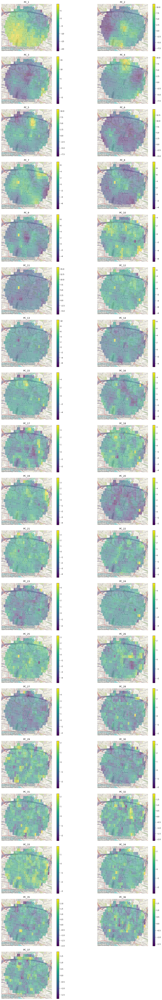

In [49]:
# Number of rows and columns for the subplot grid
n_cols = 2  # You can adjust this based on your preference
n_rows = (len(columns_to_plot) + 1) // n_cols

# Create a figure with subplots
fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, n_rows * 4))

# Flatten axes array for easy iteration, if there's more than one row
axes = axes.flatten() if n_rows > 1 else [axes]

# Loop through the columns and create a plot for each
for i, column in enumerate(columns_to_plot):
    # Plot with translucent colors
    df_pca_geometry.dropna().plot(column=column, ax=axes[i], legend=True, alpha=0.5)  # Adjust alpha for translucency

    # Add Contextily basemap
    ctx.add_basemap(axes[i], crs=df_pca_geometry.crs.to_string())

    axes[i].set_title(column)
    axes[i].set_axis_off()

# Remove any unused subplots
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

In [50]:
import pickle

with open(f"output/{place}/df_pca_geometry.pickle", 'wb') as f:
    pickle.dump(df_pca_geometry, f)

In [51]:
df_pca_with_uID = df_pca.copy()

In [52]:
df_pca_with_uID["uID"] = [str(i) for i in grid_dropped.index]

In [53]:
# Calculating Hopkins score to know whether the data is good for clustering or not.

def hopkins(X):
    d = X.shape[1]
    n = len(X)
    m = int(0.1 * n) 
    nbrs = NearestNeighbors(n_neighbors=1).fit(X.values)
 
    rand_X = sample(range(0, n, 1), m)
 
    ujd = []
    wjd = []
    for j in range(0, m):
        u_dist, _ = nbrs.kneighbors(uniform(np.amin(X,axis=0),np.amax(X,axis=0),d).reshape(1, -1), 2, return_distance=True)
        ujd.append(u_dist[0][1])
        w_dist, _ = nbrs.kneighbors(X.iloc[rand_X[j]].values.reshape(1, -1), 2, return_distance=True)
        wjd.append(w_dist[0][1])
 
    HS = sum(ujd) / (sum(ujd) + sum(wjd))
    if isnan(HS):
        print(ujd, wjd)
        HS = 0
 
    return HS


In [54]:
# Hopkins score
Hopkins_score=round(hopkins(df_pca),2)

In [55]:
print(Hopkins_score)

0.88


The Hopkins statistic (introduced by Brian Hopkins and John Gordon Skellam) is a way of measuring the cluster tendency of a data set.[1] It belongs to the family of sparse sampling tests. It acts as a statistical hypothesis test where the null hypothesis is that the data is generated by a Poisson point process and are thus uniformly randomly distributed.[2] A value close to 1 tends to indicate the data is highly clustered, random data will tend to result in values around 0.5, and uniformly distributed data will tend to result in values close to 0.[3]

In [ ]:
len(df_pca_with_uID)

In [ ]:
df_pca.to_parquet(f"output/{place}/df_pca.pq")